# Exploratory analysis


In [2]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
import ast

Manually remove the first ';' from the first row in csv file

In [4]:
df = pd.read_csv('sncb_data_challenge.csv', delimiter=';')
df.sample(2)

,incident_id,vehicles_sequence,events_sequence,seconds_to_incident_sequence,approx_lat,approx_lon,train_kph_sequence,dj_ac_state_sequence,dj_dc_state_sequence,incident_type
122,4438677,"[523, 523, 523, 523, 523, 523, 523, 523, 523, ...","[2742, 4148, 4406, 4408, 4410, 4412, 4168, 254...","[-13460, -13460, -13441, -13441, -13441, -1343...",50.465246,4.187828,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Fal...",4
746,4467645,"[672, 672, 672, 672, 672, 672, 672, 672, 672, ...","[4394, 1566, 1570, 4396, 2744, 4026, 4016, 402...","[-8270, -8270, -8270, -8116, -3719, -3242, -32...",50.885084,4.395997,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",4


Basic statistics of the dataset

In [6]:
df.describe()

,incident_id,approx_lat,approx_lon,incident_type
count,1.011000e+03,1011.000000,1011.000000,1011.000000
mean,4.522197e+06,50.548097,4.554831,25.466864
std,1.251746e+06,2.090072,0.640020,33.906447
min,4.432881e+06,0.000000,0.000000,2.000000
25%,4.445048e+06,50.485398,4.222046,9.000000
50%,4.456665e+06,50.778587,4.424038,13.000000
75%,4.468116e+06,50.910642,4.863148,14.000000
max,4.423393e+07,51.465601,6.028507,99.000000


Null values info:

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1011 entries, 0 to 1010
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   incident_id                   1011 non-null   int64  
 1   vehicles_sequence             1011 non-null   object 
 2   events_sequence               1011 non-null   object 
 3   seconds_to_incident_sequence  1011 non-null   object 
 4   approx_lat                    1011 non-null   float64
 5   approx_lon                    1011 non-null   float64
 6   train_kph_sequence            1011 non-null   object 
 7   dj_ac_state_sequence          1011 non-null   object 
 8   dj_dc_state_sequence          1011 non-null   object 
 9   incident_type                 1011 non-null   int64  
dtypes: float64(2), int64(2), object(6)
memory usage: 86.9+ KB


Visualization of incidents on map:

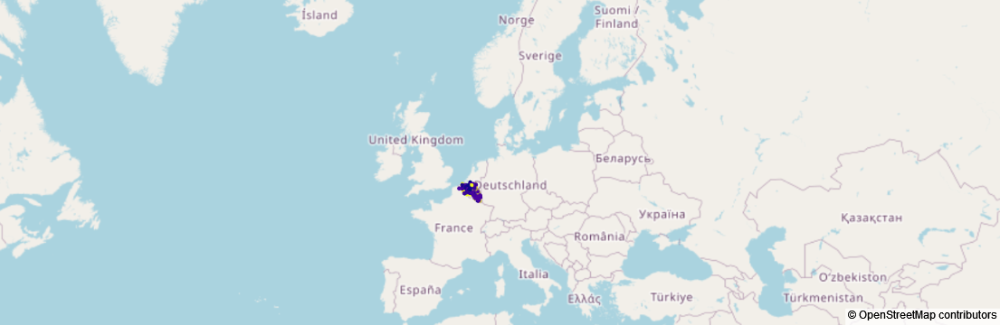

In [10]:
fig = go.Figure()

fig.add_trace(go.Scattermapbox(
    lat=df['approx_lat'],
    lon=df['approx_lon'],
    mode='markers',
    marker=go.scattermapbox.Marker(size=5, color=df['incident_type']),
    text=df['incident_id'],
    hoverinfo='text'
))

fig.update_layout(
    mapbox=dict(
        style="open-street-map",  # Map style (e.g., "carto-positron", "stamen-terrain")
        center=dict(lat=50.5039, lon=4.4699),  # Initial map center
        zoom=2  # Zoom level for the map
    ),
    margin={"r":0,"t":0,"l":0,"b":0},  # Remove default margins
)

fig.show()

Some incidents are located much outside of Belgium e.g. central Africa. We assume that there was a mistake in the geographical coordinates and keep the data since the dataset size is quite small

We can also see that the different incident types are randomly distributed in Belgium. Each color is a different incident type. Lastly, the longitude and latitude of the incidents concerns the start of the route and thus is not very useful.

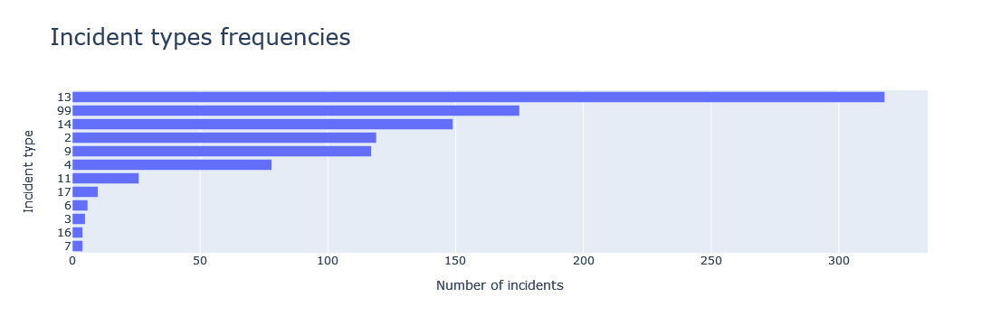

In [12]:
frequency_counts = df['incident_type'].value_counts().iloc[::-1] #reverse order
fig = go.Figure(go.Bar(
            y=frequency_counts.index.astype(str),
            x=frequency_counts.values,
            orientation='h'))

fig.update_layout(title=dict(text='Incident types frequencies',
                             font=dict(size=25)),
                xaxis_title="Number of incidents",
                yaxis_title="Incident type",)
    
fig.show()

The dataset is heavily imbalanced. There are at least 5 minority classes.

Now we can check how many of the incidents concern one or multiple vehicles:

In [15]:
train_number_dict = {}
counter = 0 
for row in df['vehicles_sequence']:
    row_list = ast.literal_eval(row) #transforming string into actual list
    number_trains = len(set(row_list))
    # check if there is no value for particular dictionary value
    if not train_number_dict.get(number_trains):
        train_number_dict[number_trains] = 0
    train_number_dict[number_trains] += 1
    counter += 1
print("Numbers: " + str(train_number_dict))
print("Percentages: " + str({key: value / counter * 100 for key, value in train_number_dict.items()}))

Numbers: {1: 419, 2: 432, 3: 155, 4: 5}
Percentages: {1: 41.44411473788329, 2: 42.72997032640949, 3: 15.33135509396637, 4: 0.4945598417408506}


We can see the percentages of incidents that consist of 1 vehicle, 2 vehicles, 3 vehicles and 4 vehicles

Next we can analyze the events sequence. Let's create a visual with the total frequencies of each event type:

Total unique values of event types: 917


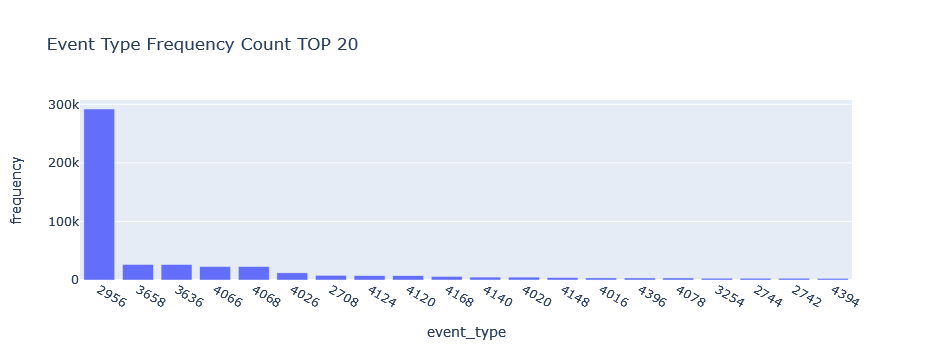

In [18]:
events_sequence_dict = {}
for events_sequence in df['events_sequence']:
    row_list = ast.literal_eval(events_sequence) #transforming string into actual list
    for event in row_list:
        # check if there is no value for particular dictionary value
        if not events_sequence_dict.get(event):
            events_sequence_dict[event] = 0
        events_sequence_dict[event] += 1
sorted_dict = dict(sorted(events_sequence_dict.items(), key=lambda item: item[1], reverse=True))
# Convert the sorted dictionary to a DataFrame
sorted_events_freq_df = pd.DataFrame(list(sorted_dict.items()), columns=['event_type', 'frequency'])
print('Total unique values of event types: ' + str(sorted_events_freq_df.shape[0]))
# Cast the 'event_type' column to string
sorted_events_freq_df['event_type'] = sorted_events_freq_df['event_type'].astype(str)
# Create a bar plot using Plotly Express
fig = px.bar(sorted_events_freq_df.head(20), x='event_type', y='frequency', title='Event Type Frequency Count TOP 20')
# Show the plot
fig.show()

Checking the visualization we can easily understand that event type $2956$ happens very often compared to any of the other events. Knowing that there are $1011$ unique event sequences, the event type $2956$ repeats itself multiple times in some event sequences
Also, there are in total $917$ unique different event types that occur at least one time in this dataset. 

This visualization does not take into account the event sequence. Now we will analyze the percentage of each event type appearing at least once in an event sequence:

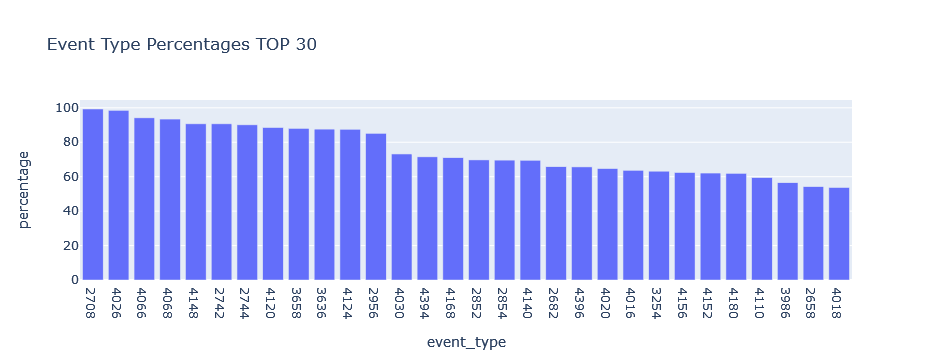

In [21]:
events_types_dict = {}
for events_sequence in df['events_sequence']:
    row_list = ast.literal_eval(events_sequence) #transforming string into actual list
    unique_events = set(row_list)
    for event in unique_events:
        if not events_types_dict.get(event):
            events_types_dict[event] = 0
        events_types_dict[event] += 1
sorted_dict = dict(sorted(events_types_dict.items(), key=lambda item: item[1], reverse=True))
# Convert the sorted dictionary to a DataFrame
sorted_events_perc_df = pd.DataFrame(list(sorted_dict.items()), columns=['event_type', 'frequency'])
sorted_events_perc_df['percentage'] = sorted_events_perc_df['frequency'] / df.shape[0] * 100
# Cast the 'event_type' column to string
sorted_events_perc_df['event_type'] = sorted_events_perc_df['event_type'].astype(str)
# Create a bar plot using Plotly Express
fig = px.bar(sorted_events_perc_df.head(30), x='event_type', y='percentage', title='Event Type Percentages TOP 30')
# Show the plot
fig.show()

We can see that multiple event types appear in more than 90% of the event sequences. This shows that some event types do not provide a lot of information on their own
- Potentially, the sequential pairing of event types could be more useful in extracting information for the incident type. This is to be explored with association rules.
- Also, potentially some event types that appear less often provide more valuable information on the incident type than the ones that appear most of the times

Now we can explore the basic statistics for the attribute `seconds_to_incident_sequence`:

In [24]:
all_times = []
intervals = []
for seconds_sequence in df['seconds_to_incident_sequence']:
    row_list = ast.literal_eval(seconds_sequence) #transforming string into actual list
    all_times.extend(row_list)
    # Calculate the intervals (differences)
    intervals_current_row = [row_list[i] - row_list[i - 1] for i in range(1, len(row_list))]
    intervals.extend(intervals_current_row)
print("Min time: " + str(min(all_times)))
print("Max time: " + str(max(all_times)))
print("Mean interval: " + str(np.mean(intervals)))
print("Median interval: " + str(np.median(intervals)))

Min time: -14400
Max time: 3600
Mean interval: 27.307959202682564
Median interval: 13.0


Now we can check the frequencies of each event over time, we will create bins of 10 minutes each:

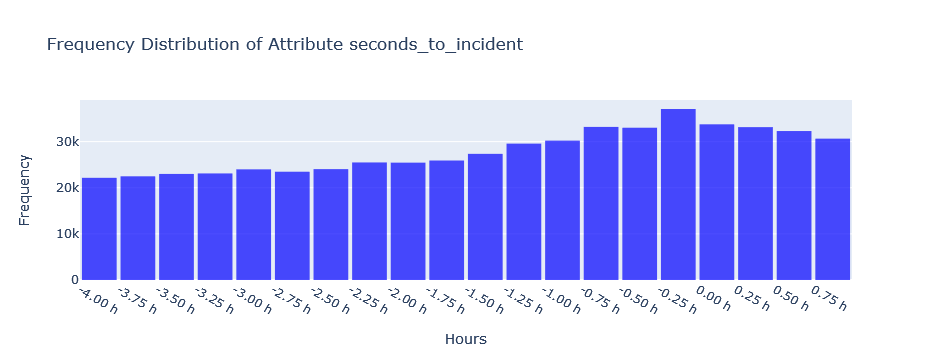

In [26]:
interval_in_plot = 60*15 # transforming seconds to minutes
# Create a histogram using Plotly
fig = go.Figure(data=[go.Histogram(
    x=all_times,
    xbins=dict(
        start=-14400,  # Start of the bins
        end=3600,     # End of the bins
        size=interval_in_plot  # Size of each bin
    ),
    marker=dict(color='blue'),
    opacity=0.7
)])

# Update layout
fig.update_layout(
    title='Frequency Distribution of Attribute seconds_to_incident',
    xaxis_title='Hours',
    yaxis_title='Frequency',
    bargap=0.1  # Gap between bars
)

# Update x-axis ticks to show hours
# Convert ticks to hours (3600 seconds in an hour)
tickvals = np.arange(-14400, 3600, interval_in_plot)  # original tick values in seconds
ticktext = [f"{val/3600:.2f} h" for val in tickvals]  # convert to hours
# Update the x-axis
fig.update_xaxes(tickvals=tickvals, ticktext=ticktext)

# Show the plot
fig.show()

The distribution resembles a lot the normal distribution without the values for the right tail. We can see a peak of frequencies right before $0$ which is the actual time of the incident taking place